<table align="center">
 <td align="center"><a target="_blank" href="https://colab.research.google.com/github/TFMUCM01/TFM/blob/main/Analisis_Financiero/Frontera_Eficiencia.ipynb">
        <img src="https://colab.research.google.com/img/colab_favicon_256px.png"  
        width="50" height="50" style="padding-bottom:5px;" /><br>Run in Google Colab</a></td>
 <td align="center"><a target="_blank" href="https://github.com/TFMUCM01/TFM/blob/main/Analisis_Financiero
 /Frontera_Eficiencia.ipynb">
        <img src="https://github.githubassets.com/images/modules/logos_page/GitHub-Mark.png"  
        width="50" height="50" style="padding-bottom:5px;" /><br>View on GitHub</a></td>
</table>


# Frontera de Eficiencia y Optimización de Portafolio

---

Este documento presenta un análisis cuantitativo y visual de portafolios de inversión en el mercado utilizando Python.  
El objetivo es construir y analizar la frontera de eficiencia mediante la simulación de miles de portafolios, calcular métricas clave como rendimiento, riesgo y ratio de Sharpe, y visualizar los resultados para identificar las combinaciones óptimas de activos.

A través de este análisis, se busca proporcionar una herramienta práctica para comparar portafolios, entender el equilibrio entre riesgo y rendimiento, y facilitar la toma de decisiones en la gestión de inversiones.

---

## Importar Librerías Necesarias


---


### Importar las librerías necesarias, incluyendo, snowflake, pandas, plotly, datetime .

In [1]:
! pip install snowflake-connector-python


[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: C:\Users\jcrom\AppData\Local\Programs\Python\Python313\python.exe -m pip install --upgrade pip


In [2]:

import numpy as np
import pandas as pd
import snowflake.connector
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px


c:\Users\jcrom\anaconda3\Lib\site-packages\snowflake\connector\options.py:104: UserWarning: You have an incompatible version of 'pyarrow' installed (19.0.0), please install a version that adheres to: 'pyarrow<19.0.0; extra == "pandas"'
  warn_incompatible_dep(


## Conexión a la Base de Datos Snowflake


---
Se establece la conexión con Snowflake usando credenciales específicas. Esto permite extraer datos históricos de precios de los activos directamente desde la base de datos corporativa.



In [3]:

conn = snowflake.connector.connect(
    user='TFMGRUPO4',
    password='TFMgrupo4ucm01_01#',
    account='VLNVLDD-WJ67583',   # << org-locator de tu URL
    warehouse='COMPUTE_WH',
    database='TFM',   # <--- CAMBIO
    schema='YAHOO_FINANCE',      # << Schema de la URL
    role='ACCOUNTADMIN'
)


## Solicitar Fechas y Tickers al Usuario


---


### Ingrese las fechas de inicio y fin para el análisis, así como los tickers (símbolos) de las df que se analizarán.


In [4]:
# Entradas (puedes dejarlas como las tenías si ya existen)
pais = input("Introduce el país (opcional): ").strip()
nombre_empresa = input("Introduce el nombre de la empresa (opcional): ").strip()
sector = input("Introduce el sector (opcional): ").strip()
industria = input("Introduce la industria (opcional): ").strip()

In [5]:
# Consulta con JOIN para traer sector/industria
base_sql = """
    SELECT DISTINCT
        lt.TICKER_YAHOO,
        lt.NOMBRE,
        lt.PAIS,
        lt.TICKET,
        cp.SECTOR,
        cp.INDUSTRIA
    FROM LISTA_TICKERS lt
    LEFT JOIN COMPANY_PROFILE cp
        ON cp.TICKER = lt.TICKER_YAHOO
"""

filters = []
params = {}

# Coincidencia parcial y case-insensitive con ILIKE
if pais:
    filters.append("lt.PAIS ILIKE %(pais)s")
    params["pais"] = f"%{pais}%"

if nombre_empresa:
    filters.append("lt.NOMBRE ILIKE %(nombre)s")
    params["nombre"] = f"%{nombre_empresa}%"

if sector:
    filters.append("cp.SECTOR ILIKE %(sector)s")
    params["sector"] = f"%{sector}%"

if industria:
    filters.append("cp.INDUSTRIA ILIKE %(industria)s")
    params["industria"] = f"%{industria}%"

query = base_sql
if filters:
    # OR como en tu lógica original
    query += " WHERE " + " OR ".join(filters)
    # Si prefieres que se cumplan TODAS, usa:
    # query += " WHERE " + " AND ".join(filters)

query += " ORDER BY lt.TICKER_YAHOO"

with conn.cursor() as cursor:
    cursor.execute(query, params)  # Snowflake (pyformat) con dict
    available_tickers = pd.DataFrame(cursor.fetchall(), columns=[col[0] for col in cursor.description])

# Muestra solo 100 filas (sin limitar la consulta)
display(available_tickers.head(100))

,TICKER_YAHOO,NOMBRE,PAIS,TICKET,SECTOR,INDUSTRIA
0,ACS.MC,"ACS, Actividades de Construccion y Servicios SA",España,ACS,Industrials,Engineering & Construction
1,ACX.MC,Acerinox SA,España,ACX,Basic Materials,Steel
2,AENA.MC,Aena SME SA,España,AENA,Industrials,Airports & Air Services
3,AMS.MC,Amadeus IT Group SA Class A,España,AMS,Technology,Information Technology Services
4,ANA.MC,Acciona SA,España,ANA,Industrials,Engineering & Construction
5,ANE.MC,Corporacion Acciona Energias Renovables SA,España,ANE,Utilities,Utilities - Renewable
6,BBVA.MC,"Banco Bilbao Vizcaya Argentaria, S.A.",España,BBVA,Financial Services,Banks - Diversified
7,BKT.MC,Bankinter SA,España,BKT,Financial Services,Banks - Regional
8,CABK.MC,CaixaBank SA,España,CABK,Financial Services,Banks - Regional
9,CLNX.MC,Cellnex Telecom S.A.,España,CLNX,Real Estate,Real Estate Services


In [6]:
input_tickers = input("Introduce los tickers separados por comas (por ejemplo, AAPL,MSFT,GOOGL): ")

In [7]:
# Solicitar fechas y tickers al usuario
fecha_inicio = "2020-01-01"
fecha_fin = "2024-12-31"
tickers = [ticker.strip().upper() for ticker in input_tickers.split(",")]


## Consulta y Descarga de Datos de Precios


---


### Se realiza una consulta SQL para descargar los precios de cierre diarios de los activos seleccionados. Los datos se almacenan en un DataFrame de pandas para su posterior procesamiento

In [8]:

# ================================
# Query de datos
# ================================
if not tickers:
    raise ValueError("La lista 'tickers' está vacía.")

# Construimos un VALUES parametrizado: (SELECT column1 FROM (VALUES (%(t0)s), (%(t1)s), ...))
vals_sql = ", ".join([f"(%(t{i})s)" for i in range(len(tickers))])
params = {f"t{i}": t for i, t in enumerate(tickers)}
params.update({"fi": fecha_inicio, "ff": fecha_fin})

query_data = f"""
    SELECT TICKER, FECHA, CLOSE
    FROM TICKERS_INDEX
    WHERE FECHA BETWEEN %(fi)s AND %(ff)s
      AND TICKER IN (SELECT column1 FROM (VALUES {vals_sql}))
      AND CLOSE IS NOT NULL
    ORDER BY FECHA
"""

# Abre SIEMPRE un cursor nuevo para esta operación
with conn.cursor() as cur:
    cur.execute(query_data, params)
    df_prices = pd.DataFrame(cur.fetchall(), columns=[col[0] for col in cur.description])



In [9]:
df_prices.head()

,TICKER,FECHA,CLOSE
0,AZM.MI,2020-01-02,21.649999619
1,DIA.MI,2020-01-02,116.500000000
2,ENEL.MI,2020-01-02,7.211999893
3,IP.MI,2020-01-02,29.200000763
4,A2A.MI,2020-01-02,1.675999999


In [10]:
df_prices.dtypes

TICKER    object
FECHA     object
CLOSE     object
dtype: object

## Preparación y Limpieza de Datos


---


### Se convierten los precios a tipo numérico y las fechas a tipo datetime. Se verifica la calidad de los datos y se prepara la estructura para análisis, asegurando que no haya valores nulos o inconsistencias.

In [11]:

df_prices['CLOSE'] = df_prices['CLOSE'].astype(float)
df_prices['FECHA'] = pd.to_datetime(df_prices['FECHA'])
df_prices.dtypes

TICKER            object
FECHA     datetime64[ns]
CLOSE            float64
dtype: object

## Transformación de Datos: Pivot y Estadísticas


---


### Se reorganizan los datos en formato de tabla (pivot), donde cada columna representa un activo y cada fila una fecha. Se exploran estadísticas descriptivas y se identifican posibles faltantes.

In [12]:

prices = df_prices.pivot(index='FECHA', columns='TICKER', values='CLOSE').sort_index()


In [13]:
prices.head()

TICKER,A2A.MI,AZM.MI,DIA.MI,ENEL.MI,IP.MI
FECHA,,,,,
2020-01-02,1.6760,21.650000,116.500000,7.212,29.200001
2020-01-03,1.6635,21.219999,116.199997,7.211,28.740000
2020-01-06,1.6560,21.080000,114.800003,7.226,28.240000
2020-01-07,1.6575,21.910000,118.400002,7.230,28.719999
2020-01-08,1.6855,22.440001,118.800003,7.270,28.500000


In [14]:
prices.describe()

TICKER,A2A.MI,AZM.MI,DIA.MI,ENEL.MI,IP.MI
count,1274.000000,1274.000000,1274.000000,1274.000000,1274.000000
mean,1.583898,20.496998,129.889827,6.643875,42.502378
std,0.291904,3.316740,33.088816,1.063992,9.238241
min,0.952800,10.700000,82.000000,4.003000,19.510000
25%,1.299125,17.827500,100.462498,5.953250,37.784999
50%,1.640500,20.480000,125.100002,6.591000,42.590000
75%,1.802500,23.257500,159.500000,7.557500,48.247500
max,2.238000,27.309999,209.399994,8.948000,68.250000


In [15]:
prices.isnull().sum()

TICKER
A2A.MI     0
AZM.MI     0
DIA.MI     0
ENEL.MI    0
IP.MI      0
dtype: int64

## Cálculo de Rendimientos de los Activos


---


### Se calculan los rendimientos diarios de cada activo como variación porcentual respecto al día anterior. Estos rendimientos son la base para la simulación y optimización de portafolios.

In [16]:

rendimientos = (prices - prices.shift(1)) / prices.shift(1)


In [17]:

numero_activos = len(rendimientos.columns)


## Simulación de Portafolios Aleatorios


---


### Se generan 50,000 portafolios aleatorios, asignando pesos aleatorios a cada activo. Para cada portafolio se calcula el rendimiento esperado y el riesgo (volatilidad), simulando la diversidad de combinaciones posibles.

In [18]:

rendimientos_portafolio = []
riesgo_portafolio = []
peso_portafolio = []


In [19]:


for x in range(50000):
    pesos = np.random.random(numero_activos)
    pesos /= np.sum(pesos)
    rendimiento = np.sum(pesos * rendimientos.mean()) * 252
    riesgo = np.sqrt(np.dot(pesos.T, np.dot(rendimientos.cov() * 252, pesos)))
    rendimientos_portafolio.append(rendimiento)
    riesgo_portafolio.append(riesgo)
    peso_portafolio.append(pesos)



In [20]:
peso_portafolio

[array([0.07745597, 0.3173023 , 0.25272699, 0.09297872, 0.25953602]),
 array([0.04344732, 0.17122891, 0.13568009, 0.29824032, 0.35140336]),
 array([0.33835673, 0.00690462, 0.16316052, 0.3790081 , 0.11257004]),
 array([0.29387189, 0.25729346, 0.01397954, 0.19230082, 0.24255428]),
 array([0.02554861, 0.39356926, 0.33702491, 0.09447569, 0.14938154]),
 array([0.15129751, 0.37731044, 0.01978092, 0.2769099 , 0.17470123]),
 array([0.16202275, 0.28451189, 0.08079919, 0.16463131, 0.30803485]),
 array([0.10046736, 0.31749676, 0.36513656, 0.0834487 , 0.13345062]),
 array([0.53016841, 0.19973389, 0.00216765, 0.23403759, 0.03389246]),
 array([0.17230072, 0.23880502, 0.21555283, 0.12182493, 0.25151651]),
 array([0.17252209, 0.24769995, 0.12725528, 0.30470977, 0.14781291]),
 array([0.39577196, 0.12154439, 0.25061748, 0.09082559, 0.14124058]),
 array([0.21351578, 0.24937534, 0.11866374, 0.34517325, 0.0732719 ]),
 array([0.13341751, 0.41239786, 0.17842385, 0.09904856, 0.17671222]),
 array([0.05348404, 

In [21]:
rendimientos_portafolio

[0.07331722822583456,
 0.07300895720779033,
 0.05909063777105693,
 0.08059736528457735,
 0.06283486435920335,
 0.07036290924739971,
 0.08089650755896555,
 0.06246273676807457,
 0.07092058533999324,
 0.07444601399955016,
 0.06351587447565497,
 0.07167335848963385,
 0.0583665826237165,
 0.07220643395963983,
 0.05793790646151946,
 0.0726876792184572,
 0.04522647654163058,
 0.06995118092518575,
 0.05645802351569039,
 0.09118375849072886,
 0.07757219535597124,
 0.08245448651651902,
 0.07926666823434392,
 0.07290472113759879,
 0.0772728818911834,
 0.07820695632477682,
 0.09670753286144587,
 0.048404889065733515,
 0.06185702563107884,
 0.05179183524411141,
 0.07828863538356252,
 0.07587279306237624,
 0.08812173513475755,
 0.05898541375339788,
 0.06105960399196291,
 0.08331810273753729,
 0.0705372850761466,
 0.08183485583561514,
 0.0754220874549195,
 0.07620445207347301,
 0.08181310787116071,
 0.06004592758750314,
 0.054034052047854775,
 0.06607994394058624,
 0.060235043560690066,
 0.062570027

In [22]:

# creamos el diccionario con el rendimiento , riesgo y pesos de cada portafolio
portafolios = {
    'Rendimientos': rendimientos_portafolio,
    'Riesgos': riesgo_portafolio,
}

for contador, ticker in enumerate(rendimientos.columns.tolist()):
    portafolios["Peso" + ticker] = [W [contador] for W in peso_portafolio]


## Construcción de la Matriz de Portafolios


---


### Se crea una matriz que almacena el rendimiento, riesgo y composición (pesos) de cada portafolio simulado. Esto permite analizar la distribución y características de todos los portafolios generados.

In [23]:
Matriz_portafolios = pd.DataFrame(portafolios)
Matriz_portafolios

,Rendimientos,Riesgos,PesoA2A.MI,PesoAZM.MI,PesoDIA.MI,PesoENEL.MI,PesoIP.MI
0,0.073317,0.235391,0.077456,0.317302,0.252727,0.092979,0.259536
1,0.073009,0.230515,0.043447,0.171229,0.135680,0.298240,0.351403
2,0.059091,0.218837,0.338357,0.006905,0.163161,0.379008,0.112570
3,0.080597,0.236328,0.293872,0.257293,0.013980,0.192301,0.242554
4,0.062835,0.240364,0.025549,0.393569,0.337025,0.094476,0.149382
...,...,...,...,...,...,...,...
49995,0.068870,0.222176,0.139549,0.024232,0.236830,0.285537,0.313852
49996,0.086417,0.243584,0.102186,0.294180,0.142948,0.071910,0.388776
49997,0.066708,0.220202,0.259006,0.116818,0.117686,0.319727,0.186763
49998,0.079589,0.228988,0.293866,0.229793,0.236511,0.009258,0.230572


##  Visualización de la Frontera de Eficiencia


---


### Se grafica la nube de portafolios en el espacio riesgo-rendimiento, mostrando la frontera de eficiencia. Esta frontera representa los portafolios óptimos para cada nivel de riesgo.

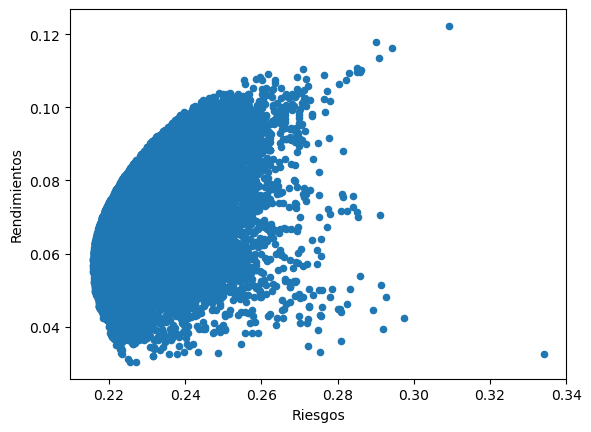

In [24]:
#frontera de eficiencia
Matriz_portafolios.plot(x='Riesgos', y='Rendimientos', kind='scatter');

##  Identificación del Portafolio de Varianza Mínima


---


### Se localiza el portafolio con menor riesgo (varianza mínima) dentro de la matriz. Este portafolio es relevante para inversores conservadores que priorizan la estabilidad.

In [25]:
#varianza minima
varianza_minima = Matriz_portafolios.iloc[Matriz_portafolios['Riesgos'].idxmin()]


C:\Users\jcrom\AppData\Local\Temp\ipykernel_2688\14309161.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.scatter(x=varianza_minima[1], y=varianza_minima[0], color='red',marker='*', s=100);


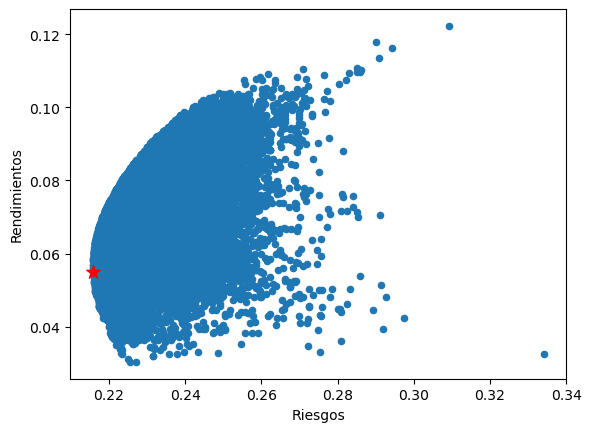

In [26]:
#frontera de eficiencia
Matriz_portafolios.plot(x='Riesgos', y='Rendimientos', kind='scatter')
plt.scatter(x=varianza_minima[1], y=varianza_minima[0], color='red',marker='*', s=100);


##  Identificación del Portafolio Óptimo (Sharpe Máximo)


---


### Se identifica el portafolio con mayor ratio de Sharpe, es decir, el que maximiza el rendimiento ajustado por riesgo. Este portafolio es óptimo desde el punto de vista de la teoría moderna de portafolios.

In [27]:
# portafolio optimo
risk_free = 0.03
portafolio_optimo = Matriz_portafolios.iloc[((Matriz_portafolios['Rendimientos'] - risk_free) / Matriz_portafolios['Riesgos']).idxmax()]
portafolio_optimo

Rendimientos    0.107591
Riesgos         0.255368
PesoA2A.MI      0.339946
PesoAZM.MI      0.009469
PesoDIA.MI      0.060477
PesoENEL.MI     0.005204
PesoIP.MI       0.584905
Name: 11635, dtype: float64

C:\Users\jcrom\AppData\Local\Temp\ipykernel_2688\296694422.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.scatter(x=varianza_minima[1], y=varianza_minima[0], color='red',marker='*', s=100)
C:\Users\jcrom\AppData\Local\Temp\ipykernel_2688\296694422.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.scatter(x=portafolio_optimo[1], y=portafolio_optimo[0], color='blue',marker='*', s=100);


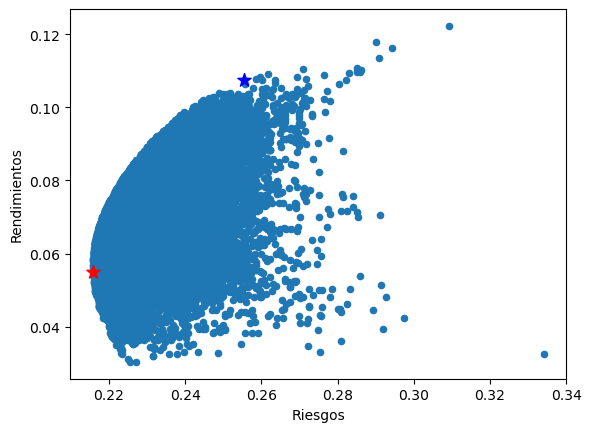

In [28]:
Matriz_portafolios.plot(x='Riesgos', y='Rendimientos', kind='scatter')
plt.scatter(x=varianza_minima[1], y=varianza_minima[0], color='red',marker='*', s=100)
plt.scatter(x=portafolio_optimo[1], y=portafolio_optimo[0], color='blue',marker='*', s=100);

##  Visualización Avanzada con Plotly: Frontera de Eficiencia y Composición


---


### Se utiliza Plotly para crear un gráfico interactivo de la frontera de eficiencia, donde cada punto representa un portafolio y se puede consultar la composición de activos y métricas clave (Sharpe, riesgo, rendimiento).

In [29]:
# === FRONTERA DE EFICIENCIA — ESTILO SML ===
# Requiere: import plotly.graph_objects as go, import numpy as np

fig = go.Figure()

# ---------- helpers ----------
def crear_info_composicion(row_index, top_n=8, thr=0.01):
    comp = []
    row = Matriz_portafolios.iloc[row_index]
    for t in rendimientos.columns:
        w = row.get(f"Peso{t}", 0)
        if w > thr:
            comp.append(f"{t}: {w:.1%}")
    return "<br>".join(comp[:top_n])

def crear_composicion_detallada(port, thr=0.005):
    comp = []
    for t in rendimientos.columns:
        w = float(port.get(f"Peso{t}", 0))
        if w > thr:
            comp.append(f"{t}: {w:.1%}")
    return "<br>".join(comp)

# ---------- datos base ----------
x = Matriz_portafolios['Riesgos']
y = Matriz_portafolios['Rendimientos']
rf_used = float(rf_anual if 'rf_anual' in globals() else (rf if 'rf' in globals() else 0.03))

# sharpe de cada portafolio (sobre rf_used)
sh_col = (y - rf_used) / x
customdata_info = np.stack([
    np.array(sh_col, dtype=float),
    np.array([crear_info_composicion(i) for i in range(len(Matriz_portafolios))], dtype=object)
], axis=-1)

# ---------- nube de portafolios ----------
fig.add_trace(go.Scatter(
    x=x, y=y, mode='markers',
    marker=dict(
        size=6,
        color=y,                 # colorear por rendimiento esperado
        colorscale='Viridis',
        showscale=True,
        colorbar=dict(title="Rendimiento<br>esperado")
    ),
    showlegend=False,
    hovertemplate=(
        "<b>📊 Portafolio</b><br>"
        "Riesgo = %{x:.3f}<br>"
        "Rendimiento = %{y:.3f}<br>"
        "Sharpe = %{customdata[0]:.3f}<br><br>"
        "<b>💼 Composición</b><br>%{customdata[1]}<extra></extra>"
    ),
    customdata=customdata_info,
    cliponaxis=False
))

# ---------- puntos especiales ----------
comp_mv = crear_composicion_detallada(varianza_minima)
fig.add_trace(go.Scatter(
    x=[varianza_minima['Riesgos']], y=[varianza_minima['Rendimientos']],
    mode='markers',
    marker=dict(symbol='star', size=18, color='green',
                line=dict(width=2, color='darkgreen')),
    showlegend=False,
    hovertemplate=(
        "<b>🌟 Mínima varianza</b><br>"
        "Riesgo = %{x:.4f}<br>"
        "Rendimiento = %{y:.4f}<br><br>"
        "<b>Composición</b><br>" + comp_mv + "<extra></extra>"
    ),
    cliponaxis=False
))

sh_opt = (portafolio_optimo['Rendimientos'] - rf_used) / portafolio_optimo['Riesgos']
comp_opt = crear_composicion_detallada(portafolio_optimo)
fig.add_trace(go.Scatter(
    x=[portafolio_optimo['Riesgos']], y=[portafolio_optimo['Rendimientos']],
    mode='markers',
    marker=dict(symbol='star', size=18, color='blue',
                line=dict(width=2, color='darkblue')),
    showlegend=False,
    hovertemplate=(
        "<b>🎯 Sharpe máximo</b><br>"
        f"Sharpe = {sh_opt:.4f}<br>"
        "Riesgo = %{x:.4f}<br>"
        "Rendimiento = %{y:.4f}<br><br>"
        "<b>Composición</b><br>" + comp_opt + "<extra></extra>"
    ),
    cliponaxis=False
))

# ---------- padding y rangos para que no se corte ----------
x_min, x_max = float(np.nanmin(x)), float(np.nanmax(x))
y_min, y_max = float(np.nanmin(y)), float(np.nanmax(y))
x_pad = (x_max - x_min) * 0.06 if x_max > x_min else 0.02
y_pad = (y_max - y_min) * 0.10 if y_max > y_min else 0.02

# ---------- líneas guía opcionales ----------
# Línea horizontal en Rf
fig.add_hline(
    y=rf_used, line_dash="dash", line_width=1.5,
    annotation_text=f"Rf = {rf_used:.2%}",
    annotation_position="bottom right", annotation_yshift=-6
)

# ---------- anotaciones tipo “caja” dentro del gráfico ----------
periodo_txt = ""
if 'start_date' in globals() and 'end_date' in globals():
    periodo_txt = f"{start_date} → {end_date}"
info_caja_top = (
    "<b>Frontera de Eficiencia</b>"
    f"<br>Rf = {rf_used:.2%}"
    f"<br>N portafolios = {len(Matriz_portafolios):,}"
    + (f"<br>Periodo: {periodo_txt}" if periodo_txt else "")
)
fig.add_annotation(
    xref="paper", yref="paper",
    x=0.99, y=0.98, xanchor="right", yanchor="top",
    text=info_caja_top, showarrow=False, align="right",
    bgcolor="rgba(255,255,255,0.90)",
    bordercolor="rgba(0,0,0,0.15)", borderwidth=1, borderpad=6,
    font=dict(size=11)
)

nota_caja_bottom = (
    "<b>Marcadores</b>: "
    "<span>⭐ Mínima varianza</span> · "
    "<span>⭐ Sharpe máximo</span>"
    "<br>Color: rendimiento esperado"
)
fig.add_annotation(
    xref="paper", yref="paper",
    x=0.98, y=0.06, xanchor="right", yanchor="bottom",
    text=nota_caja_bottom, showarrow=False, align="right",
    bgcolor="rgba(255,255,255,0.90)",
    bordercolor="rgba(0,0,0,0.15)", borderwidth=1, borderpad=6,
    font=dict(size=11)
)

# ---------- layout (estilo simple_white, márgenes generosos) ----------
fig.update_layout(
    template='simple_white',
    title="Frontera de Eficiencia ",
    xaxis_title="Riesgo (Volatilidad)",
    yaxis_title="Rendimiento esperado",
    margin=dict(l=60, r=170, t=90, b=80),   # r grande para la barra de color
    hovermode='closest',
    showlegend=False,
    autosize=True,
    width=None,
    height=720
)

# ejes con rango y grid suave
fig.update_xaxes(
    range=[x_min - x_pad, x_max + x_pad],
    showline=True, linecolor="#888",
    gridcolor="#E5E5E5", gridwidth=0.5
)
fig.update_yaxes(
    range=[y_min - y_pad, y_max + y_pad],
    showline=True, linecolor="#888",
    gridcolor="#E5E5E5", gridwidth=0.5,
    tickformat=".2%"
)

# ---------- etiquetas puntuales (opcional) ----------
# Si quieres texto encima de los puntos especiales:
fig.add_annotation(
    x=varianza_minima['Riesgos'], y=varianza_minima['Rendimientos'],
    text="Mínima varianza", showarrow=True, ax=24, ay=-28,
    arrowhead=2, arrowcolor="green", font=dict(size=10, color="green")
)
fig.add_annotation(
    x=portafolio_optimo['Riesgos'], y=portafolio_optimo['Rendimientos'],
    text="Sharpe máximo", showarrow=True, ax=24, ay=-28,
    arrowhead=2, arrowcolor="blue", font=dict(size=10, color="blue")
)

fig.show(config={"responsive": True, "displayModeBar": True})


## Conclusión


---


### Conclusión general del análisis:

El análisis realizado sobre la frontera de eficiencia y la optimización de portafolios , utilizando simulaciones y visualizaciones avanzadas en Python, proporciona una visión integral de las posibilidades de inversión en el mercado.  
Mediante la simulación de miles de portafolios, se identifican las combinaciones óptimas de activos que maximizan el rendimiento ajustado por riesgo (ratio de Sharpe) y minimizan la volatilidad.  
La visualización de la frontera de eficiencia permite comparar de manera intuitiva el equilibrio entre riesgo y rendimiento, facilitando la toma de decisiones informadas en la gestión de inversiones.

Es importante destacar que, aunque la teoría moderna de portafolios y la frontera de eficiencia ofrecen una base sólida para la diversificación y la optimización, los resultados dependen de los datos históricos y las condiciones de mercado. Por ello, se recomienda complementar este análisis con consideraciones fundamentales y una adecuada gestión del riesgo.

---

### Glosario de conceptos clave:

**Frontera de eficiencia:**  
Conjunto de portafolios que ofrecen el mayor rendimiento posible para cada nivel de riesgo. Representa el equilibrio óptimo entre riesgo y retorno.

**Portafolio de mínima varianza:**  
Portafolio con el menor riesgo posible dentro del universo analizado. Es ideal para inversores conservadores.

**Portafolio óptimo (Sharpe máximo):**  
Portafolio que maximiza el ratio de Sharpe, es decir, el rendimiento ajustado por riesgo. Es el preferido desde la perspectiva de la teoría moderna de portafolios.

**Simulación de portafolios:**  
Generación de miles de combinaciones aleatorias de activos para explorar la diversidad de opciones y encontrar las más eficientes.

**Visualización interactiva:**  
Gráficos avanzados que permiten explorar la composición, rendimiento y riesgo de cada portafolio, facilitando el análisis comparativo.

---

**Consideraciones finales:**  
La optimización de portafolios es una herramienta poderosa para la gestión de inversiones, pero debe ser utilizada junto con el análisis fundamental y una estrategia de gestión de riesgos adecuada. Los resultados históricos no garantizan rendimientos futuros y el mercado puede presentar cambios inesperados. Se recomienda revisar periódicamente la composición del portafolio y adaptar la estrategia a las condiciones del mercado y los objetivos personales.

# TFM GRUPO 4  